In [1]:
!pip install tensorboardX
!pip uninstall -y tensorboard tb-nightly
!pip install tb-nightly
!pip install kornia


     |████████████████████████████████| 124 kB 8.5 MB/s 
Found existing installation: tensorboard 2.5.0
Uninstalling tensorboard-2.5.0:
  Successfully uninstalled tensorboard-2.5.0
     |████████████████████████████████| 5.7 MB 8.5 MB/s 
     |████████████████████████████████| 303 kB 8.4 MB/s 


In [2]:
from google.colab import drive
drive.mount('drive')

Mounted at drive


In [3]:
%cd /content/drive/MyDrive/MSc_project/my_depth/mobilenetv2


/content/drive/MyDrive/MSc_project/my_depth/mobilenetv2


In [4]:
import os
import argparse
import torch
import torch.nn as nn
torch.cuda.empty_cache()
from model_dense_mobilev2 import Model
from torch.utils.tensorboard import SummaryWriter
from loss import ssim
from data import getTrainingTestingData
from utils import DepthNorm
import tqdm
%pylab inline
%load_ext tensorboard

Populating the interactive namespace from numpy and matplotlib


In [5]:
os.getcwd()

'/content/drive/MyDrive/MSc_project/my_depth/mobilenetv2'

In [6]:
batch_size = 7
train_loader, test_loader = getTrainingTestingData(batch_size=batch_size)

Loading dataset zip file...Loaded (40550).


In [8]:
import tempfile
log_dir = tempfile.mkdtemp()
%tensorboard --logdir {log_dir} --reload_interval 1

Output hidden; open in https://colab.research.google.com to view.

In [9]:
writer = SummaryWriter(log_dir + '/test', flush_secs= 1)

In [10]:
epochs = 8
model = Model().cuda()
model = nn.DataParallel(model)
print('Model created.')
lr=0.0001
optimizer = torch.optim.Adam( model.parameters(), lr )
l1_criterion = nn.L1Loss()

Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth


  0%|          | 0.00/13.6M [00:00<?, ?B/s]

Model created.


In [11]:
print(model)

DataParallel(
  (module): Model(
    (encoder): Encoder(
      (original_model): MobileNetV2(
        (features): Sequential(
          (0): ConvBNActivation(
            (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU6(inplace=True)
          )
          (1): InvertedResidual(
            (conv): Sequential(
              (0): ConvBNActivation(
                (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
                (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
                (2): ReLU6(inplace=True)
              )
              (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            )
          )
          (2): InvertedRe

In [12]:
  for epoch in range(epochs):

    model.train()

    for i, sample_batched in enumerate(tqdm.tqdm(train_loader)):
        
        optimizer.zero_grad()

        # Prepare sample and target
        image = torch.autograd.Variable(sample_batched['image'].cuda())
        depth = torch.autograd.Variable(sample_batched['depth'].cuda(non_blocking=True))

        # Normalize depth
        depth_n = DepthNorm( depth )

        # Predict
        output = model(image)

        # if args.model_type == 'densedepth':

        l_depth = l1_criterion(output, depth_n)
        l_ssim = torch.clamp((1 - ssim(output, depth_n, val_range = 1000.0 / 10.0)) * 0.5, 0, 1)

        loss = (1.0 * l_ssim) + (0.1 * l_depth)

        # else:

        #     loss = masked_criterion(output, depth_n)

        # Update step
        loss.backward()

        optimizer.step()

        # Log to tensorboard
        writer.add_scalar('Train/Loss', loss, epoch)

    torch.save(model.module.state_dict(), 'epoch%s_mobilenetv2.pth'%(str(epoch +1)))
    print('Epoch:%d Model Saved!'%(epoch+1))


100%|██████████| 5793/5793 [45:37<00:00,  2.12it/s]


Epoch:1 Model Saved!


100%|██████████| 5793/5793 [45:49<00:00,  2.11it/s]


Epoch:2 Model Saved!


100%|██████████| 5793/5793 [45:55<00:00,  2.10it/s]


Epoch:3 Model Saved!


100%|██████████| 5793/5793 [45:56<00:00,  2.10it/s]


Epoch:4 Model Saved!


100%|██████████| 5793/5793 [45:50<00:00,  2.11it/s]


Epoch:5 Model Saved!


100%|██████████| 5793/5793 [45:49<00:00,  2.11it/s]


Epoch:6 Model Saved!


100%|██████████| 5793/5793 [45:53<00:00,  2.10it/s]


Epoch:7 Model Saved!


100%|██████████| 5793/5793 [45:48<00:00,  2.11it/s]


Epoch:8 Model Saved!


# Evaluate

In [13]:
import os
import glob
import time
import argparse
import torch
from torch import nn
# from model_dense import Model
# from model.fcrn import ResNet
# from model.densedepth import Model
from utils import evaluate
from matplotlib import pyplot as plt
import numpy as np
from zipfile import ZipFile

def extract_zip(input_zip):
    input_zip=ZipFile(input_zip)
    return {name: input_zip.read(name) for name in input_zip.namelist()}

data = extract_zip('data/nyu_test.zip')
from io import BytesIO
rgb = np.load(BytesIO(data['eigen_test_rgb.npy']))
depth = np.load(BytesIO(data['eigen_test_depth.npy']))
crop = np.load(BytesIO(data['eigen_test_crop.npy']))
print('Test data loaded.\n')


model.eval()


start = time.time()
print('Testing...')

e = evaluate(model, rgb, depth, crop, batch_size=1)
print("{:>10}, {:>10}, {:>10}, {:>10}, {:>10}, {:>10}".format('a1', 'a2', 'a3', 'rel', 'rms', 'log_10'))
print("{:10.4f}, {:10.4f}, {:10.4f}, {:10.4f}, {:10.4f}, {:10.4f}".format(e[0],e[1],e[2],e[3],e[4],e[5]))

end = time.time()
print('\nTest time', end-start, 's')


Test data loaded.

Testing...


100%|██████████| 654/654 [01:20<00:00,  8.14it/s]

        a1,         a2,         a3,        rel,        rms,     log_10
    0.7928,     0.9559,     0.9903,     0.1465,     0.5256,     0.0630
        a1,         a2,         a3,        rel,        rms,     log_10
    0.7928,     0.9559,     0.9903,     0.1465,     0.5256,     0.0630

Test time 80.33225750923157 s


# Predict images


Loaded (8) images of size (480, 640, 3).


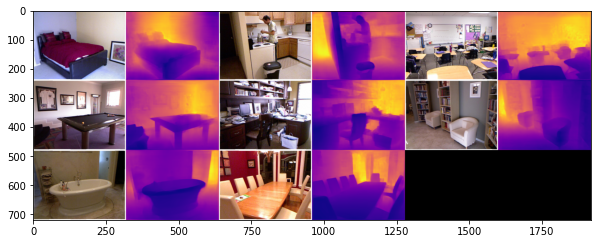

In [14]:
import os
import glob
import argparse
import matplotlib
import torch

from utils import predict, load_images, display_images
from matplotlib import pyplot as plt

inputs = load_images(glob.glob('examples/*.png') )
print('\nLoaded ({0}) images of size {1}.'.format(inputs.shape[0], inputs.shape[1:]))

model.eval()

# Compute results
outputs = predict(model, inputs)


# Display results
viz = display_images(outputs.copy(), inputs.copy())
plt.figure(figsize=(10,4))
plt.imshow(viz)
plt.savefig('test.png')
plt.show()
